In [34]:
import time
start = time.time()

import nibabel as nib
img = nib.load("./TotalSegmentator v2/99/artifactFiles/s0000/segmentations/femur_left.nii.gz")
data = img.get_fdata()

img2 = nib.load("./TotalSegmentator v2/99/artifactFiles/s0000/segmentations/femur_right.nii.gz")
data2 = img2.get_fdata()

In [35]:
data += data2

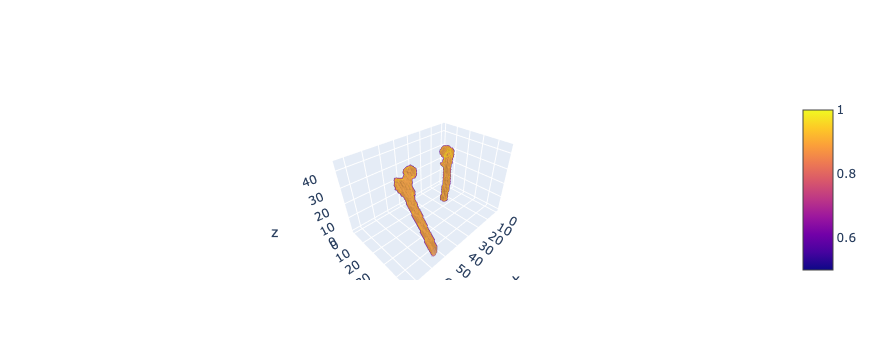

In [36]:
import plotly.graph_objects as go
import numpy as np

# Create a 3D NumPy array with random segmentation data (1 for segmented, 0 for background)
# In practice, this would be your 3D segmentation array
segmentation = data[::4,::4,::4]

# Plot the 3D segmentation using Plotly
fig = go.Figure(data=go.Volume(
    x=np.arange(segmentation.shape[0]).repeat(segmentation.shape[1] * segmentation.shape[2]),
    y=np.tile(np.arange(segmentation.shape[1]).repeat(segmentation.shape[2]), segmentation.shape[0]),
    z=np.tile(np.arange(segmentation.shape[2]), segmentation.shape[0] * segmentation.shape[1]),
    value=segmentation.flatten(),
    opacity=0.1, # Adjust opacity for better visualization
    surface_count=20, # Number of contour levels
    isomin=0.5, # Threshold for segmentation boundary
    isomax=1, # Maximum value for the isosurface
))

fig.show()


In [ ]:
print(time.time() - start)